Copyright (c) Meta Platforms, Inc. and affiliates.

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/co-tracker/blob/main/notebooks/demo.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# CoTracker: It is Better to Track Together
This is a demo for <a href="https://co-tracker.github.io/">CoTracker</a>, a model that can track any point in a video.

<img src="https://www.robots.ox.ac.uk/~nikita/storage/cotracker/bmx-bumps.gif" alt="Logo" width="50%">

Don't forget to turn on GPU support if you're running this demo in Colab.

**Runtime** -> **Change runtime type** -> **Hardware accelerator** -> **GPU**

Let's install dependencies for Colab:

In [ ]:
!git clone https://github.com/facebookresearch/co-tracker
%cd co-tracker
!pip install -e .
!pip install opencv-python einops timm matplotlib moviepy flow_vis
!mkdir checkpoints
%cd checkpoints
!wget https://huggingface.co/facebook/cotracker/resolve/main/cotracker2.pth

fatal: destination path 'co-tracker' already exists and is not an empty directory.
/home/student/Downloads/co-tracker
Obtaining file:///home/student/Downloads/co-tracker
  Preparing metadata (setup.py) ... done
  Attempting uninstall: cotracker
    Found existing installation: cotracker 2.0
    Uninstalling cotracker-2.0:
      Successfully uninstalled cotracker-2.0
  Running setup.py develop for cotracker
mkdir: cannot create directory ‘checkpoints’: File exists
/home/student/Downloads/co-tracker/checkpoints
--2024-07-12 17:47:55--  https://huggingface.co/facebook/cotracker/resolve/main/cotracker2.pth
Resolving huggingface.co (huggingface.co)... 2600:9000:275b:1600:17:b174:6d00:93a1, 2600:9000:275b:b400:17:b174:6d00:93a1, 2600:9000:275b:e00:17:b174:6d00:93a1, ...
Connecting to huggingface.co (huggingface.co)|2600:9000:275b:1600:17:b174:6d00:93a1|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.huggingface.co/repos/99/80/9980d78abf629546bc2

In [ ]:
%cd ..
import os
import torch

from base64 import b64encode
from cotracker.utils.visualizer import Visualizer, read_video_from_path
from IPython.display import HTML

/home/student/Downloads/co-tracker


Read a video from CO3D:

In [ ]:
video = read_video_from_path('./assets/apple.mp4')
video = torch.from_numpy(video).permute(0, 3, 1, 2)[None].float()

In [ ]:
def show_video(video_path):
    video_file = open(video_path, "r+b").read()
    video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
    return HTML(f"""<video width="640" height="480" autoplay loop controls><source src="{video_url}"></video>""")

show_video("./assets/apple.mp4")

Import CoTrackerPredictor and create an instance of it. We'll use this object to estimate tracks:

In [ ]:
from cotracker.predictor import CoTrackerPredictor
os.chdir("/home/student/maaf/co-tracker")
model = CoTrackerPredictor(
    checkpoint=os.path.join(
        './checkpoints/cotracker2.pth'
    )
)
if torch.cuda.is_available():
    model = model.cuda()

In [ ]:
if torch.cuda.is_available():
    model = model.cuda()
    video = video.cuda()

In [ ]:
video.shape

torch.Size([1, 50, 3, 720, 1296])

Track points sampled on a regular grid of size 30\*30 on the first frame:

In [ ]:
pred_tracks, pred_visibility = model(video, grid_size=10)

In [ ]:
pred_tracks.shape

torch.Size([1, 50, 100, 2])

Visualize and save the result:

In [ ]:
vis = Visualizer(save_dir='./videos', pad_value=100)
vis.visualize(video=video, tracks=pred_tracks, visibility=pred_visibility, filename='teaser');

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1496, 920) to (1504, 928) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x73b2dc0] Warning: data is not aligned! This can lead to a speed loss


Video saved to ./videos/teaser.mp4


In [ ]:
show_video("./videos/teaser.mp4")

## Tracking manually selected points

We will start by tracking points queried manually.
We define a queried point as: [time, x coord, y coord]

So, the code below defines points with different x and y coordinates sampled on frames 0, 10, 20, and 30:

In [ ]:
queries = torch.tensor([
    [0., 400., 350.],  # point tracked from the first frame
    [10., 600., 500.], # frame number 10
    [20., 750., 600.], # ...
    [30., 900., 200.]
])
if torch.cuda.is_available():
    queries = queries.cuda()

That's what our queried points look like:

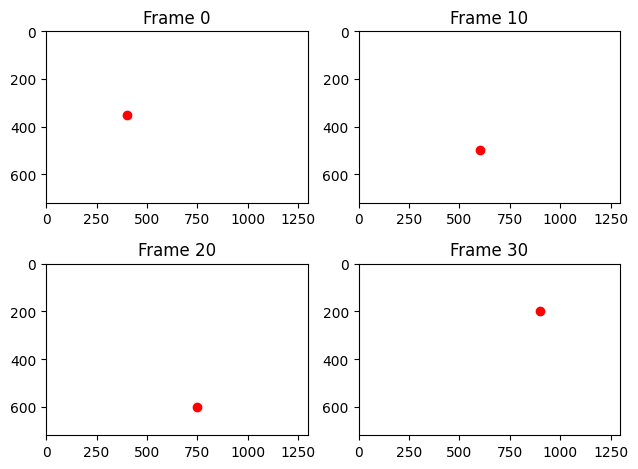

In [ ]:
import matplotlib.pyplot as plt
# Create a list of frame numbers corresponding to each point
frame_numbers = queries[:,0].int().tolist()

fig, axs = plt.subplots(2, 2)
axs = axs.flatten()

for i, (query, frame_number) in enumerate(zip(queries, frame_numbers)):
    ax = axs[i]
    ax.plot(query[1].item(), query[2].item(), 'ro')

    ax.set_title("Frame {}".format(frame_number))
    ax.set_xlim(0, video.shape[4])
    ax.set_ylim(0, video.shape[3])
    ax.invert_yaxis()

plt.tight_layout()
plt.show()

We pass these points as input to the model and track them:

In [ ]:
pred_tracks, pred_visibility = model(video, queries=queries[None])

In [ ]:
pred_tracks.shape

torch.Size([1, 50, 4, 2])

Finally, we visualize the results with tracks leaving traces from the frame where the tracking starts.
Color encodes time:

In [ ]:
vis = Visualizer(
    save_dir='./videos',
    linewidth=6,
    mode='cool',
    tracks_leave_trace=-1
)
vis.visualize(
    video=video,
    tracks=pred_tracks,
    visibility=pred_visibility,
    filename='queries');

Video saved to ./videos/queries.mp4


In [ ]:
show_video("./videos/queries.mp4")

Notice that points queried at frames 10, 20, and 30 are tracked **incorrectly** before the query frame. This is because CoTracker is an online algorithm and only tracks points in one direction. However, we can also run it backward from the queried point to track in both directions. Let's correct this:

In [ ]:
pred_tracks, pred_visibility = model(video, queries=queries[None], backward_tracking=True)
vis.visualize(
    video=video,
    tracks=pred_tracks,
    visibility=pred_visibility,
    filename='queries_backward');

Video saved to ./videos/queries_backward.mp4


In [ ]:
show_video("./videos/queries_backward.mp4")

## Points on a regular grid

### Tracking forward from the frame number x

Let's now sample points on a regular grid and start tracking from the frame number 20 with a grid of 30\*30.

In [ ]:
grid_size = 30
grid_query_frame = 20

In [ ]:
pred_tracks, pred_visibility = model(video, grid_size=grid_size, grid_query_frame=grid_query_frame)

In [ ]:
vis = Visualizer(save_dir='./videos', pad_value=100)
vis.visualize(
    video=video,
    tracks=pred_tracks,
    visibility=pred_visibility,
    filename='grid_query_20',
    query_frame=grid_query_frame);

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1496, 920) to (1504, 928) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x6d92dc0] Warning: data is not aligned! This can lead to a speed loss


Video saved to ./videos/grid_query_20.mp4


Note that tracking starts only from points sampled on a frame in the middle of the video. This is different from the grid in the first example:

In [ ]:
show_video("./videos/grid_query_20.mp4")

### Tracking forward **and backward** from the frame number x

In [ ]:
grid_size = 30
grid_query_frame = 20

Let's activate backward tracking:

In [ ]:
pred_tracks, pred_visibility = model(video, grid_size=grid_size, grid_query_frame=grid_query_frame, backward_tracking=True)
vis.visualize(
    video=video,
    tracks=pred_tracks,
    visibility=pred_visibility,
    filename='grid_query_20_backward');

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1496, 920) to (1504, 928) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x6fb8c00] Warning: data is not aligned! This can lead to a speed loss


Video saved to ./videos/grid_query_20_backward.mp4


As you can see, we are now tracking points queried in the middle from the first frame:

In [ ]:
show_video("./videos/grid_query_20_backward.mp4")

In [ ]:
import torch

# Detach CUDA
torch.cuda.empty_cache()

## Regular grid + Segmentation mask

Let's now sample points on a grid and filter them with a segmentation mask.
This allows us to track points sampled densely on an object because we consume less GPU memory.

In [ ]:
import numpy as np
from PIL import Image
grid_size = 100

In [ ]:
input_mask = './assets/apple_mask.png'
segm_mask = np.array(Image.open(input_mask))

That's a segmentation mask for the first frame:

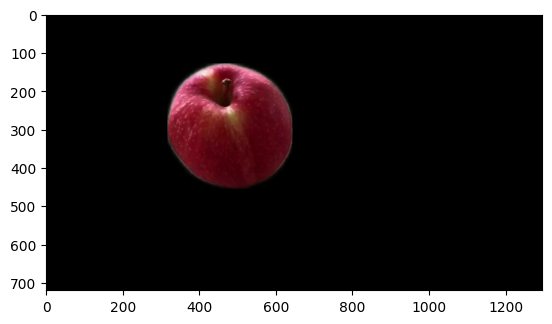

In [ ]:
plt.imshow((segm_mask[...,None]/255.*video[0,0].permute(1,2,0).cpu().numpy()/255.))

In [ ]:
grid_size = 20

In [ ]:
pred_tracks, pred_visibility = model(video[:,1,...][None], grid_size=grid_size, segm_mask=torch.from_numpy(segm_mask)[None, None])
# vis = Visualizer(
#     save_dir='./videos',
#     pad_value=100,
#     linewidth=2,
# )
# vis.visualize(
#     video=video,
#     tracks=pred_tracks,
#     visibility=pred_visibility,
#     filename='segm_grid');

In [ ]:
pred_tracks.shape,video.shape

(torch.Size([1, 1, 40, 2]), torch.Size([1, 50, 3, 720, 1296]))

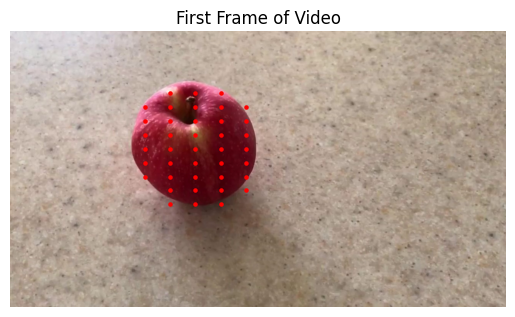

In [ ]:
import matplotlib.pyplot as plt

# Visualize the first frame of the video
plt.imshow(video[0, 1].permute(1, 2, 0).cpu().numpy().astype(int))

# Overlay the pred_tracks
plt.scatter(pred_tracks[0, 0, :, 0].cpu().numpy(), pred_tracks[0, 0, :, 1].cpu().numpy(), color='red', s=5)

plt.title('First Frame of Video')
plt.axis('off')
plt.show()


We are now only tracking points on the object (and around):

In [ ]:
show_video("./videos/segm_grid.mp4")

## Dense Tracks

### Tracking forward **and backward** from the frame number x

CoTracker also has a mode to track **every pixel** in a video in a **dense** manner but it is much slower than in previous examples. Let's downsample the video in order to make it faster:

In [ ]:
video.shape

torch.Size([1, 50, 3, 720, 1296])

In [ ]:
import torch.nn.functional as F
video_interp = F.interpolate(video[0], [200, 360], mode="bilinear")[None]

The video now has a much lower resolution:

In [ ]:
video_interp.shape

torch.Size([1, 50, 3, 200, 360])

In [ ]:
grid_query_frame=20

Again, let's track points in both directions. This will only take a couple of minutes:

In [ ]:
pred_tracks, pred_visibility = model(video_interp, grid_query_frame=grid_query_frame, backward_tracking=True)

step 0 / 4
step 1 / 4
step 2 / 4
step 3 / 4


Visualization with an optical flow color encoding:

In [ ]:
vis = Visualizer(
    save_dir='./videos',
    pad_value=20,
    linewidth=1,
    mode='optical_flow'
)
vis.visualize(
    video=video_interp,
    tracks=pred_tracks,
    visibility=pred_visibility,
    filename='dense');

Video saved to ./videos/dense.mp4


In [ ]:
show_video("./videos/dense.mp4")

#Our code starts from here:

#**Here we used the .npz files along with the .json files, which were generated by DEVA model in order to visualize the segmented masks of each frame for a certain sequence (sequence 1 view4).**

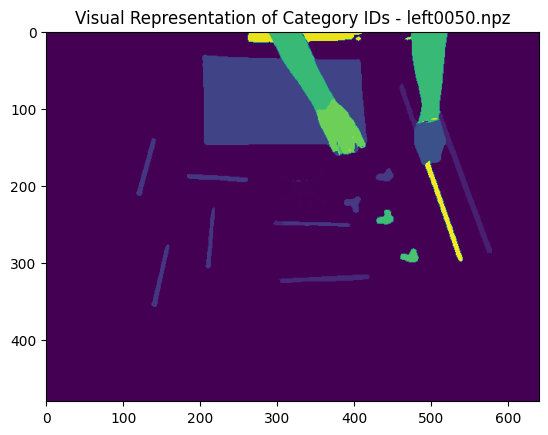

Unique Category IDs in the array for left0050.npz:
 [       0    68404  1465945  1825921  2670251  2745939  3385613  3385915
  4056774 11184377 11392622 11786587 12839676 15359163 15933937 16460808]


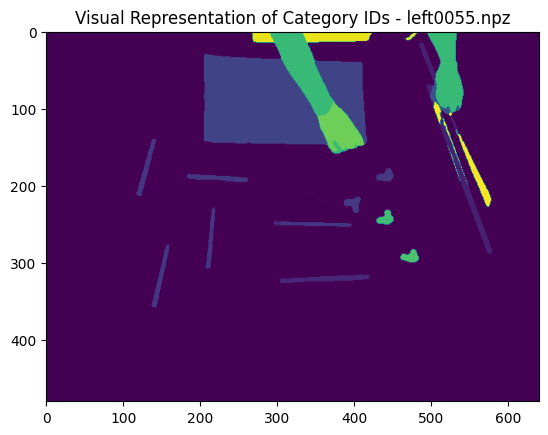

Unique Category IDs in the array for left0055.npz:
 [       0    68404  1465945  1825921  2670251  2745939  3385915  4056774
 11184377 11392622 11786587 12839676 15933937 16460808]


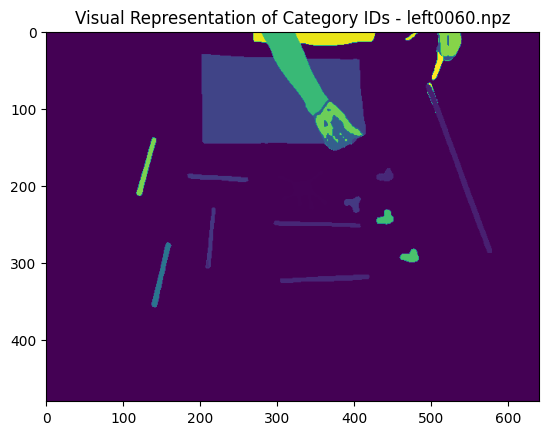

Unique Category IDs in the array for left0060.npz:
 [       0    68404  1465945  1825921  1871184  2670251  2745939  3385613
  3385915  4056774  4998151  6398242 11184377 11392622 11786587 12839676
 13187533 13480110 15933937 16460808]


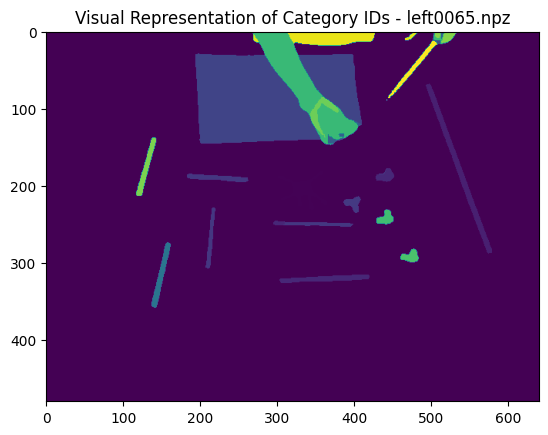

Unique Category IDs in the array for left0065.npz:
 [       0    68404  1465945  1825921  1871184  2670251  2745939  3385915
  4056774  4998151  6398242 11184377 11392622 11786587 12839676 13187533
 13480110 15933937 16460808]


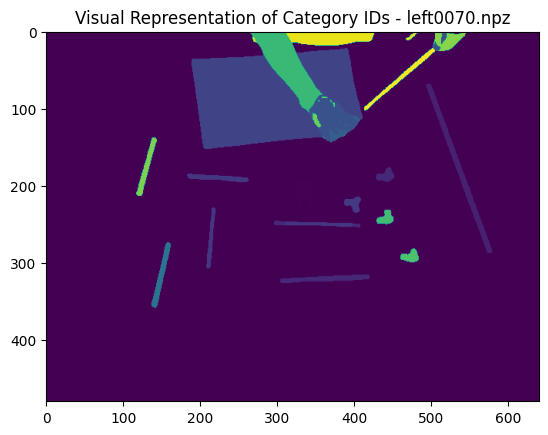

Unique Category IDs in the array for left0070.npz:
 [       0    68404  1465945  1825921  1871184  2670251  2745939  3385915
  4056774  4155555  4998151  6398242 11184377 11392622 11786587 12839676
 13187533 13480110 15933937 16460808]


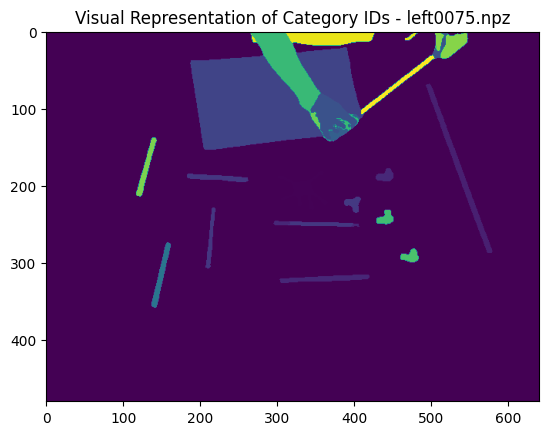

Unique Category IDs in the array for left0075.npz:
 [       0    68404  1465945  1825921  1871184  2670251  2745939  3385915
  4056774  4155555  4998151  6398242 11184377 11392622 11786587 12839676
 13187533 13480110 15933937 16460808]


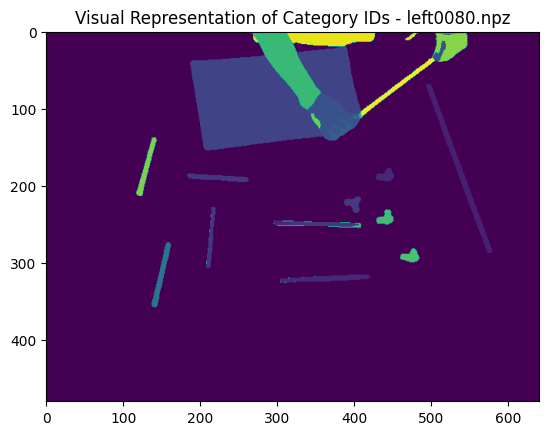

Unique Category IDs in the array for left0080.npz:
 [       0    68404  1465945  1825921  1871184  2670251  2745939  3385915
  4056774  4155555  4998151  6398242 10162279 10946353 11184377 11392622
 11786587 12839676 13187533 13480110 15933937 16460808]


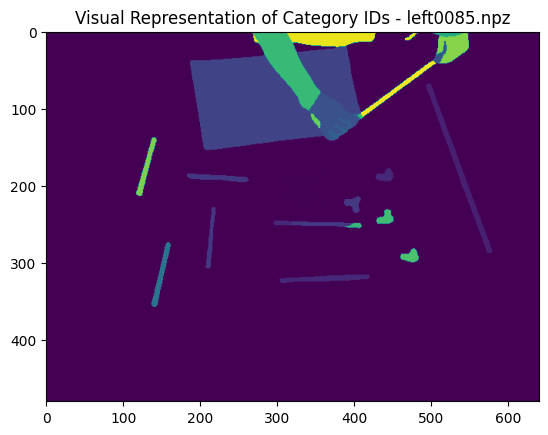

Unique Category IDs in the array for left0085.npz:
 [       0    68404  1465945  1825921  1871184  2670251  2745939  3385915
  4056774  4155555  4998151  6398242 10162279 10946353 11184377 11392622
 11786587 12839676 13187533 13480110 15933937 16460808]


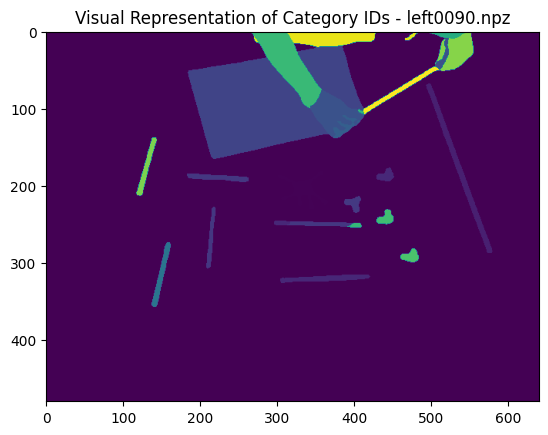

Unique Category IDs in the array for left0090.npz:
 [       0    68404  1465945  1825921  1871184  2670251  2745939  3385915
  4056774  4155555  4998151  6398242 10162279 10946353 11184377 11392622
 11786587 13187533 13480110 15933937 16460808]


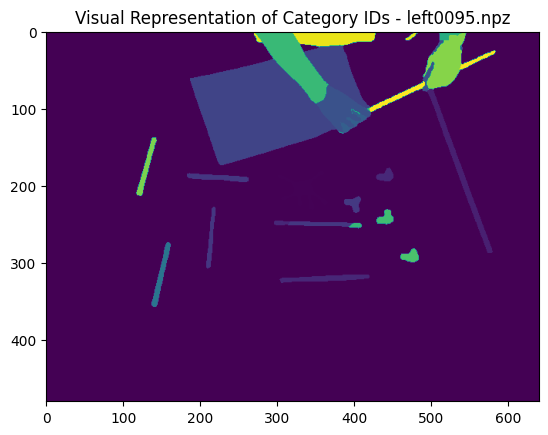

Unique Category IDs in the array for left0095.npz:
 [       0    68404  1465945  1825921  1871184  2670251  2745939  3385915
  4056774  4155555  4998151  6398242 10162279 10946353 11184377 11392622
 11786587 13187533 13480110 15933937 16460808]


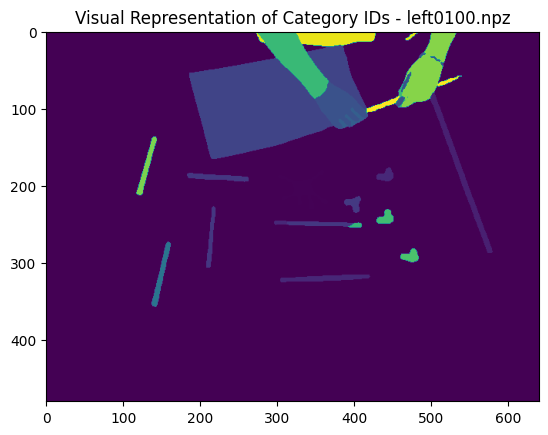

Unique Category IDs in the array for left0100.npz:
 [       0    68404  1465945  1825921  1871184  2670251  2745939  3385915
  4056774  4155555  4998151  6398242 10946353 11184377 11392622 11786587
 13187533 13480110 15933937 16460808]


In [ ]:
import json
import numpy as np
import matplotlib.pyplot as plt
import os


image_dir = "/home/student/Downloads/seq_1_segmented/seq_1_view_4_segmented/Annotations/"
json_path = "/home/student/Downloads/seq_1_segmented/seq_1_view_4_segmented/seq_1_view_4_segmented.json"

with open(json_path, 'r') as f:
    json_data = json.load(f)


file_to_id_to_category_id = {}
for annotation in json_data['annotations']:
    file_name = annotation['file_name']
    file_num = int(file_name[4:8])
    if file_num % 5 == 0 and file_num >= 50:  # Check if the file name is a multiple of 5 and >= 50
        id_to_category_id = {}
        for segment_info in annotation['segments_info']:
            if segment_info['id'] != 0:  # Ensure no id is assigned to 0
                id_to_category_id[segment_info['id']] = segment_info['category_id'] + 1  # Increase the ids by 1
        file_to_id_to_category_id[file_name] = id_to_category_id


for file_name in sorted(os.listdir(image_dir)):
    if file_name.endswith('.npz'):
        file_num = int(file_name[4:8])
        if file_num % 5 == 0 and file_num >= 50:
            file_path = os.path.join(image_dir, file_name)


            data = np.load(file_path)
            array = data['arr_0']


            if 'arr_0' in data:
                # Get the corresponding id to category_id mapping
                id_to_category_id = file_to_id_to_category_id.get(file_name.replace('.npz', '.jpg'), {})


                category_array = np.copy(array)


                for id_value, category_id in id_to_category_id.items():
                    category_array[array == id_value] = category_id


                plt.imshow(array)
                plt.title(f'Visual Representation of Category IDs - {file_name}')
                plt.show()

                # Print the unique category_id values
                unique_category_ids = np.unique(array)
                print(f"Unique Category IDs in the array for {file_name}:\n", unique_category_ids)
            else:
                print(f"Key 'arr_0' does not exist in the NPZ file: {file_name}")

            data.close()


## This code filters out the segmented objects in the given frames. There are various category ids, we picked the category id 0 to visualize which is the corresponding id to the rods, since we do not have different labels for different rods, it will show all the present rods in the frame.

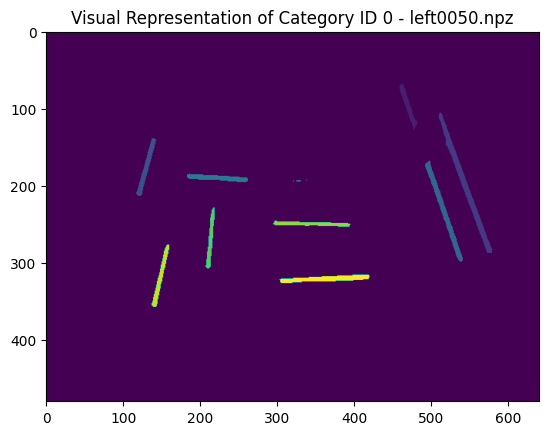

Unique Category IDs in the array for left0050.npz (should be only 1):
 [ 0  1  2  3  4  5  6  7  8  9 10 11 12]


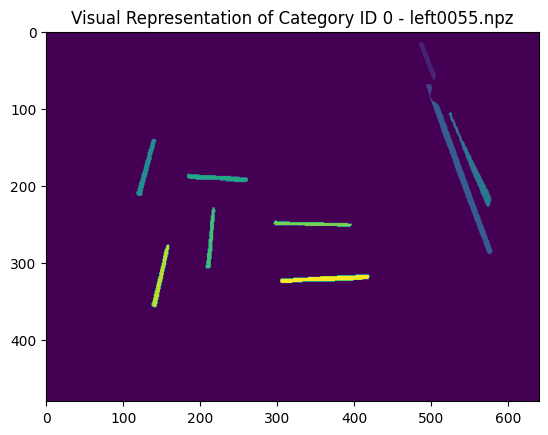

Unique Category IDs in the array for left0055.npz (should be only 1):
 [ 0  1  2  3  4  5  6  7  8  9 10]


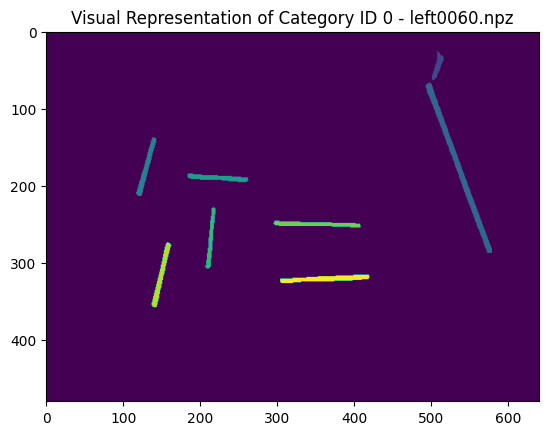

Unique Category IDs in the array for left0060.npz (should be only 1):
 [0 1 2 3 4 5 6 7 8 9]


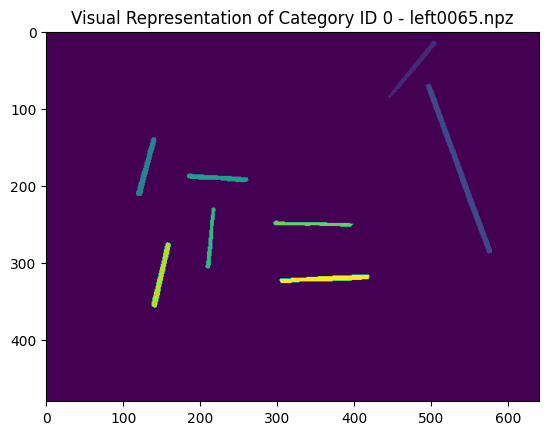

Unique Category IDs in the array for left0065.npz (should be only 1):
 [0 1 2 3 4 5 6 7 8 9]


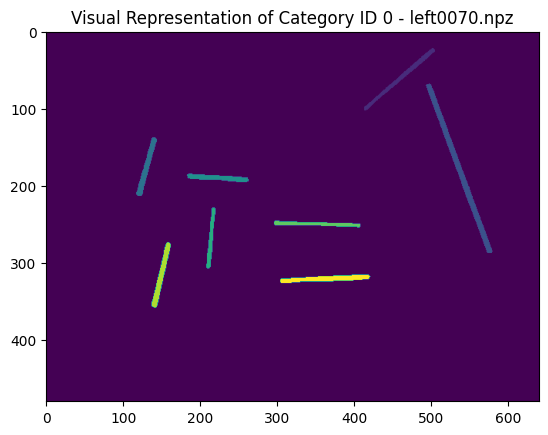

Unique Category IDs in the array for left0070.npz (should be only 1):
 [0 1 2 3 4 5 6 7 8]


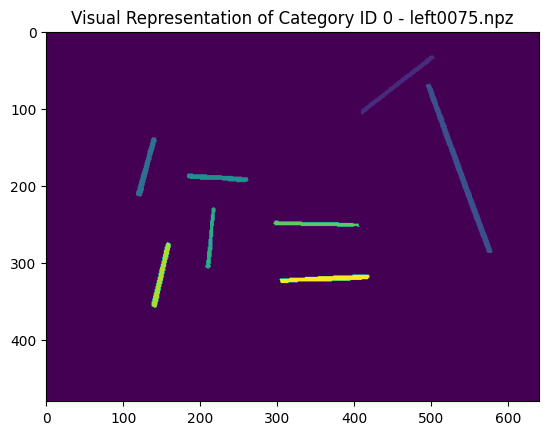

Unique Category IDs in the array for left0075.npz (should be only 1):
 [0 1 2 3 4 5 6 7 8]


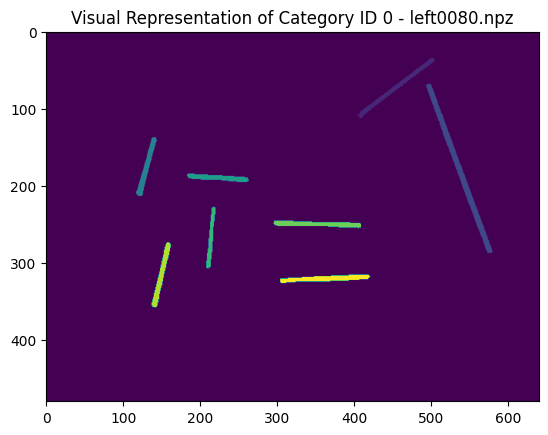

Unique Category IDs in the array for left0080.npz (should be only 1):
 [0 1 2 3 4 5 6 7 8 9]


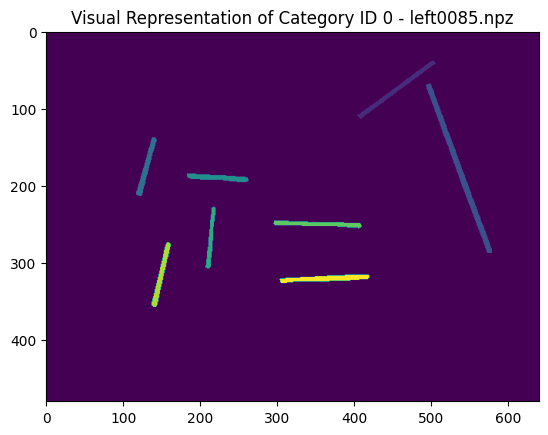

Unique Category IDs in the array for left0085.npz (should be only 1):
 [0 1 2 3 4 5 6 7 8]


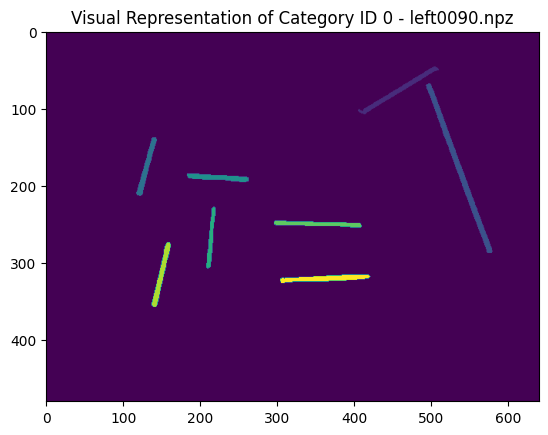

Unique Category IDs in the array for left0090.npz (should be only 1):
 [0 1 2 3 4 5 6 7 8]


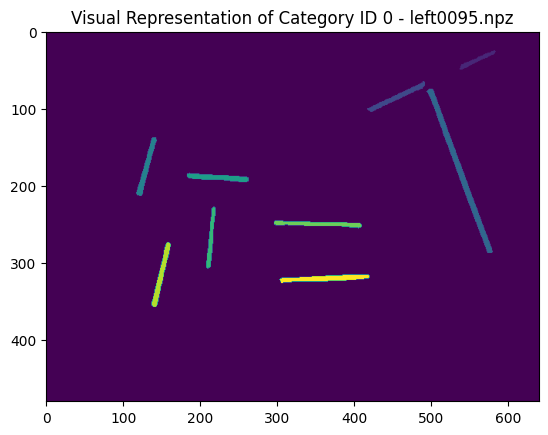

Unique Category IDs in the array for left0095.npz (should be only 1):
 [0 1 2 3 4 5 6 7 8 9]


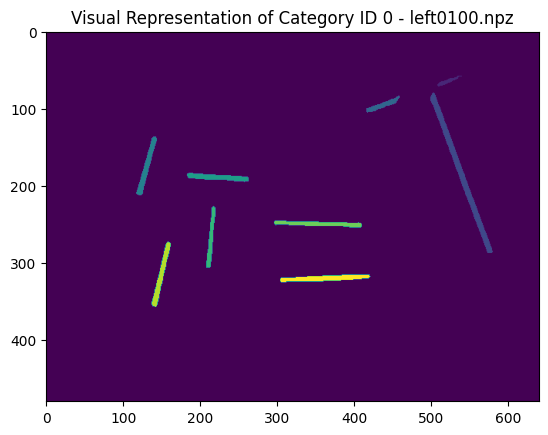

Unique Category IDs in the array for left0100.npz (should be only 1):
 [0 1 2 3 4 5 6 7 8 9]


In [ ]:
import json
import numpy as np
import matplotlib.pyplot as plt
import os


image_dir = "/home/student/Downloads/seq_1_segmented/seq_1_view_4_segmented/Annotations/"
json_path = "/home/student/Downloads/seq_1_segmented/seq_1_view_4_segmented/seq_1_view_4_segmented.json"


chosen_category_id = 0


with open(json_path, 'r') as f:
    json_data = json.load(f)


file_to_id_to_category_info = {}
for annotation in json_data['annotations']:
    file_name = annotation['file_name']
    file_num = int(file_name[4:8])
    if file_num % 5 == 0 and file_num >= 50:
        id_to_category_info = {}
        for segment_info in annotation['segments_info']:
            if segment_info['id'] != 0:
                id_to_category_info[segment_info['id']] = {
                    'category_id': segment_info['category_id'] + 1,
                    'other_info': segment_info
                }
        file_to_id_to_category_info[file_name] = id_to_category_info


for file_name in sorted(os.listdir(image_dir)):
    if file_name.endswith('.npz'):
        file_num = int(file_name[4:8])
        if file_num % 5 == 0 and file_num >= 50:
            file_path = os.path.join(image_dir, file_name)


            data = np.load(file_path)
            array = data['arr_0']


            if 'arr_0' in data:

                id_to_category_info = file_to_id_to_category_info.get(file_name.replace('.npz', '.jpg'), {})


                category_array = np.zeros_like(array)


                for id_value, info in id_to_category_info.items():
                    if info['category_id'] == chosen_category_id + 1:
                        category_array[array == id_value] = info['category_id']

                import numpy as np
                from scipy.ndimage import label


                category_array, num_features = label(category_array)


                plt.imshow(category_array)
                plt.title(f'Visual Representation of Category ID {chosen_category_id} - {file_name}')
                plt.show()


                unique_category_ids = np.unique(category_array)

                print(f"Unique Category IDs in the array for {file_name} (should be only {chosen_category_id + 1}):\n", unique_category_ids)
            else:
                print(f"Key 'arr_0' does not exist in the NPZ file: {file_name}")


            data.close()


## Filtering out one rod from the category of rods.


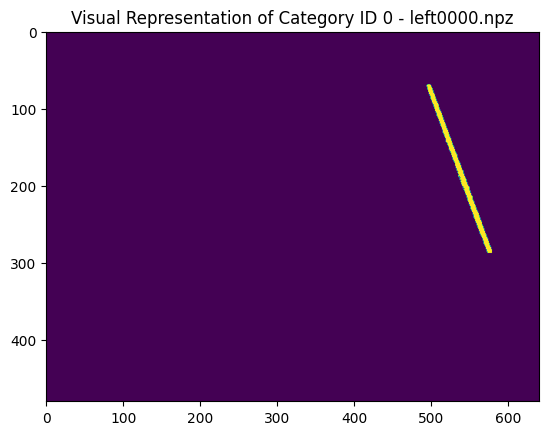

Unique Category IDs in the array for left0000.npz (should be only 1):
 [0 1]


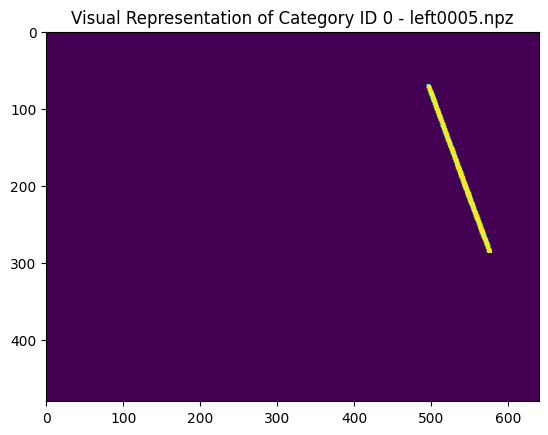

Unique Category IDs in the array for left0005.npz (should be only 1):
 [0 1]


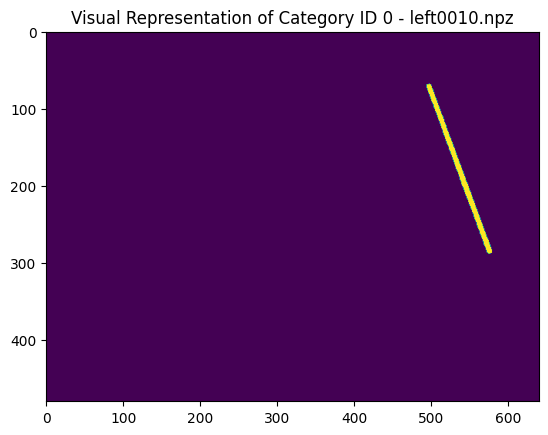

Unique Category IDs in the array for left0010.npz (should be only 1):
 [0 1]


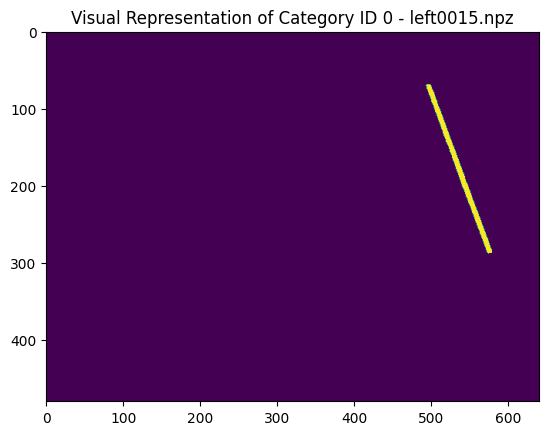

Unique Category IDs in the array for left0015.npz (should be only 1):
 [0 1]


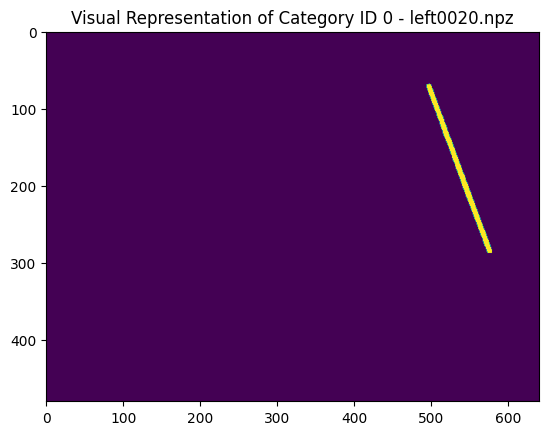

Unique Category IDs in the array for left0020.npz (should be only 1):
 [0 1]


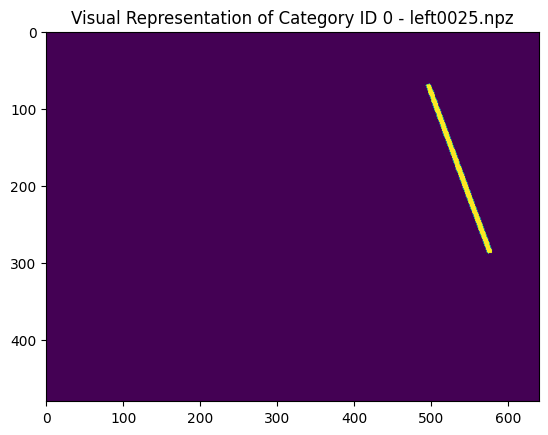

Unique Category IDs in the array for left0025.npz (should be only 1):
 [0 1]


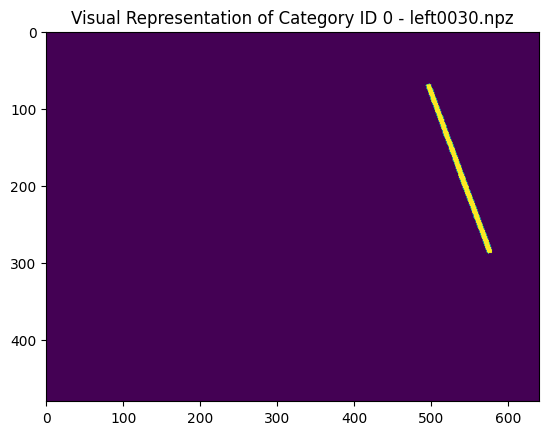

Unique Category IDs in the array for left0030.npz (should be only 1):
 [0 1]


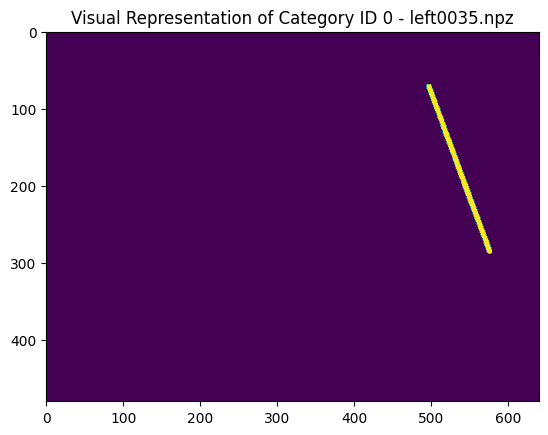

Unique Category IDs in the array for left0035.npz (should be only 1):
 [0 1]


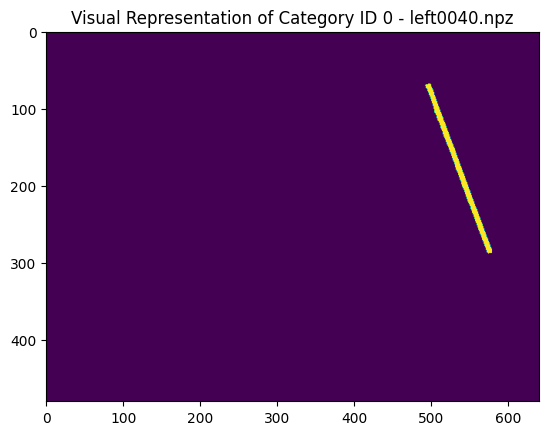

Unique Category IDs in the array for left0040.npz (should be only 1):
 [0 1]


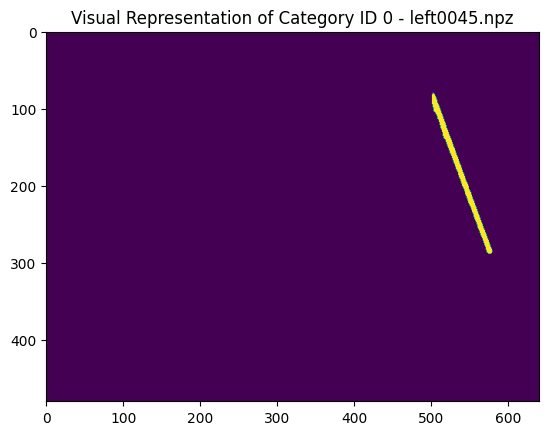

Unique Category IDs in the array for left0045.npz (should be only 1):
 [0 1]


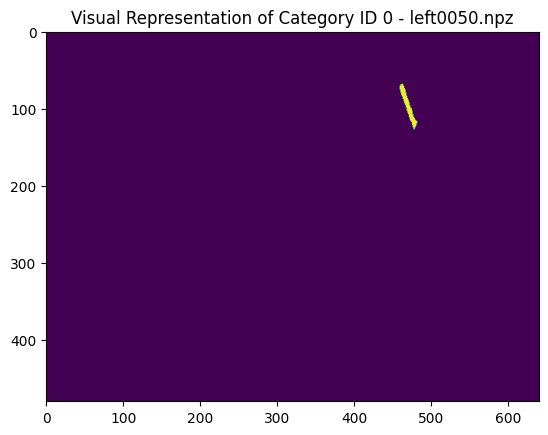

Unique Category IDs in the array for left0050.npz (should be only 1):
 [0 1]


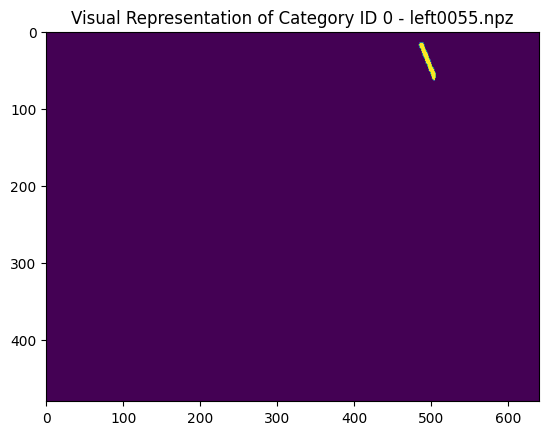

Unique Category IDs in the array for left0055.npz (should be only 1):
 [0 1]


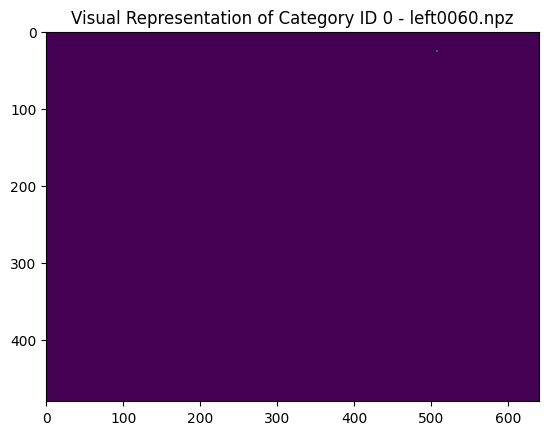

Unique Category IDs in the array for left0060.npz (should be only 1):
 [0 1]


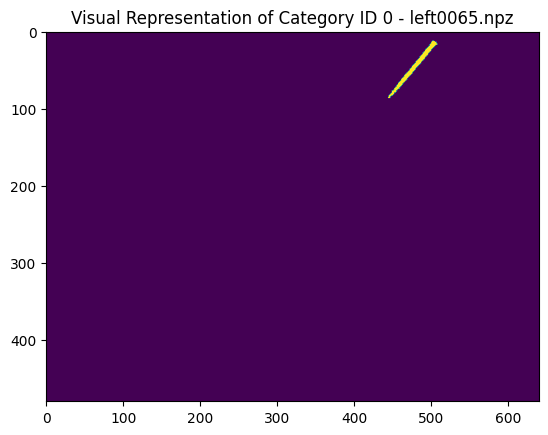

Unique Category IDs in the array for left0065.npz (should be only 1):
 [0 1]


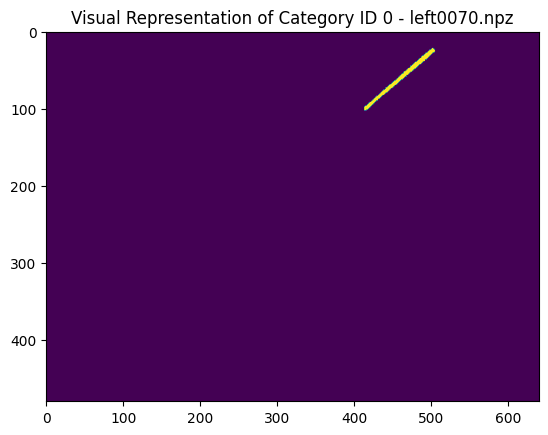

Unique Category IDs in the array for left0070.npz (should be only 1):
 [0 1]


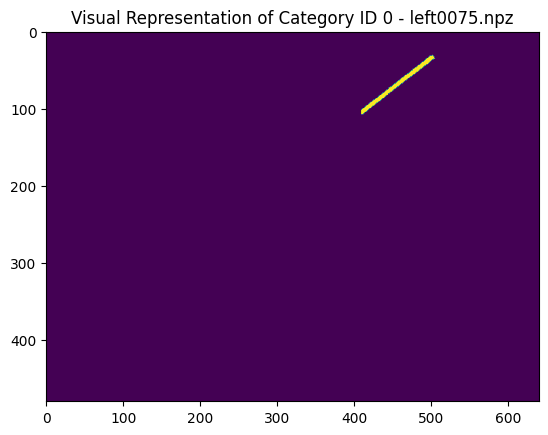

Unique Category IDs in the array for left0075.npz (should be only 1):
 [0 1]


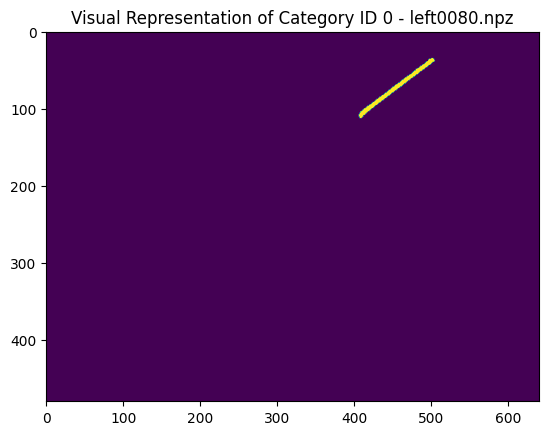

Unique Category IDs in the array for left0080.npz (should be only 1):
 [0 1]


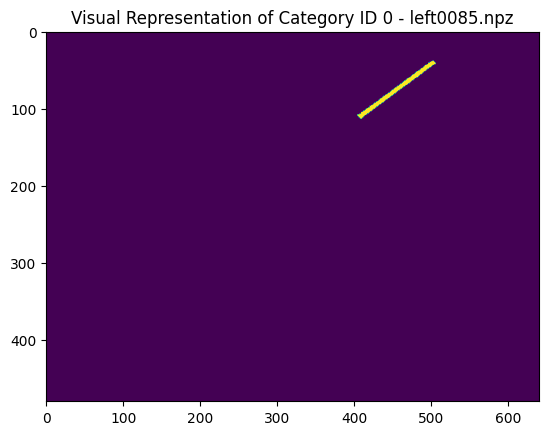

Unique Category IDs in the array for left0085.npz (should be only 1):
 [0 1]


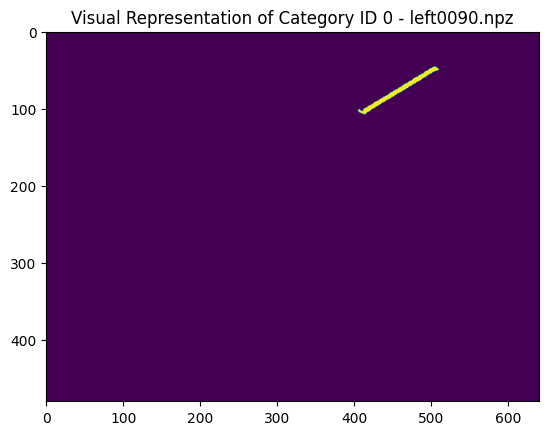

Unique Category IDs in the array for left0090.npz (should be only 1):
 [0 1]


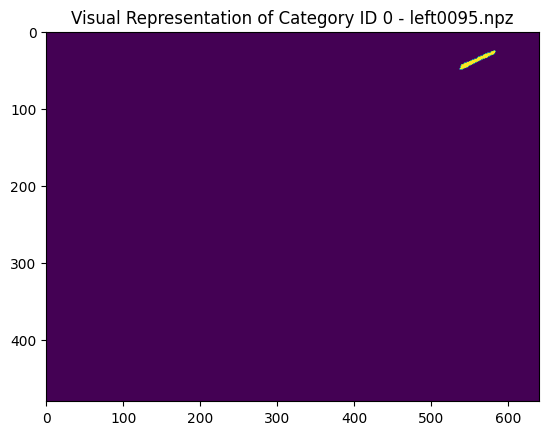

Unique Category IDs in the array for left0095.npz (should be only 1):
 [0 1]


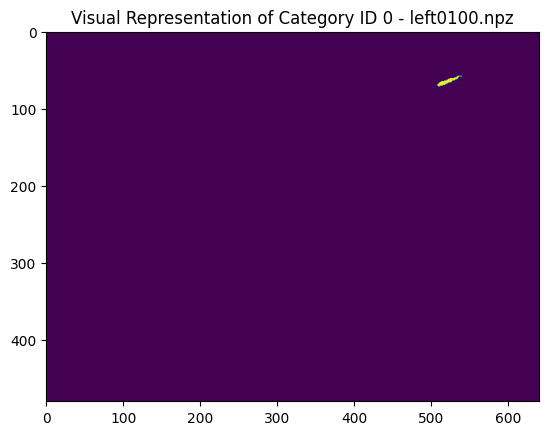

Unique Category IDs in the array for left0100.npz (should be only 1):
 [0 1]


In [ ]:
import json
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.ndimage import label


image_dir = "/home/student/Downloads/seq_1_segmented/seq_1_view_4_segmented/Annotations/"
json_path = "/home/student/Downloads/seq_1_segmented/seq_1_view_4_segmented/seq_1_view_4_segmented.json"


chosen_category_id = 0


with open(json_path, 'r') as f:
    json_data = json.load(f)


file_to_id_to_category_info = {}
for annotation in json_data['annotations']:
    file_name = annotation['file_name']
    file_num = int(file_name[4:8])
    if file_num % 1 == 0 and file_num >= 0:
        id_to_category_info = {}
        for segment_info in annotation['segments_info']:
            if segment_info['id'] != 0:
                id_to_category_info[segment_info['id']] = {
                    'category_id': segment_info['category_id'] + 1,
                    'other_info': segment_info
                }
        file_to_id_to_category_info[file_name] = id_to_category_info


for file_name in sorted(os.listdir(image_dir)):
    if file_name.endswith('.npz'):
        file_num = int(file_name[4:8])
        if file_num % 5 == 0 and file_num >= 0:
            file_path = os.path.join(image_dir, file_name)


            data = np.load(file_path)
            array = data['arr_0']


            if 'arr_0' in data:

                id_to_category_info = file_to_id_to_category_info.get(file_name.replace('.npz', '.jpg'), {})


                category_array = np.zeros_like(array)


                for id_value, info in id_to_category_info.items():
                    if info['category_id'] == chosen_category_id + 1:
                        category_array[array == id_value] = info['category_id']


                labeled_array, num_features = label(category_array)


                valid_ids = [1]
                for unique_id in np.unique(labeled_array):
                    if unique_id not in valid_ids:
                        labeled_array[labeled_array == unique_id]= 0


                plt.imshow(labeled_array, cmap='viridis')
                plt.title(f'Visual Representation of Category ID {chosen_category_id} - {file_name}')
                plt.show()


                unique_category_ids = np.unique(labeled_array)
                print(f"Unique Category IDs in the array for {file_name} (should be only {chosen_category_id + 1}):\n", unique_category_ids)
            else:
                print(f"Key 'arr_0' does not exist in the NPZ file: {file_name}")

            data.close()


## Here by applying the CoTracker model to the segmented mask of the rod classes, we can return the track points (sampling points) of the objects that we have. We can increase the sampling rate by altering the grid_size argument in the Cotracker model.
## Track_points are the x,y coordinates of the image that we have and it's a crucial value later for making a mapping from the real coordinates to image coordinates using PnP.


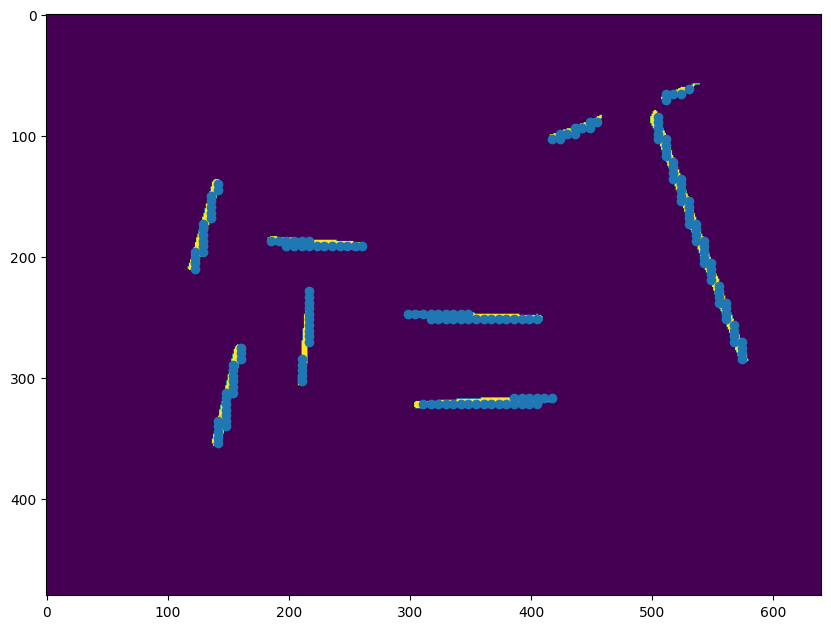

In [ ]:
repeated_channel = category_array[None,None,None].repeat(3, axis=2)
repeated_channel.shape



import cv2
import matplotlib.pyplot as plt
video_path = "/home/student/Downloads/seq_1_seq_1_view_4.webm"

cap = cv2.VideoCapture(video_path)
ret, frame_ours = cap.read()
cap.release()
frame_ours = cv2.cvtColor(frame_ours, cv2.COLOR_BGR2RGB)

track_points,_ = model(torch.from_numpy(repeated_channel).cuda().float(), grid_size=100,segm_mask=torch.from_numpy(category_array)[None, None].cuda().float())
plt.figure(figsize=(10,10))
plt.imshow(category_array)
plt.scatter(track_points[0,0,:,0].cpu().numpy(), track_points[0,0,:,1].cpu().numpy())

##Here we have the image coordinates of the filtered instances, in order to be able to track one specific rod, we used our previous codes to filter out the rest.

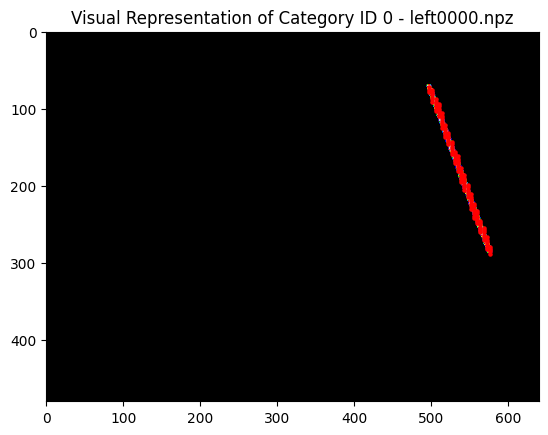

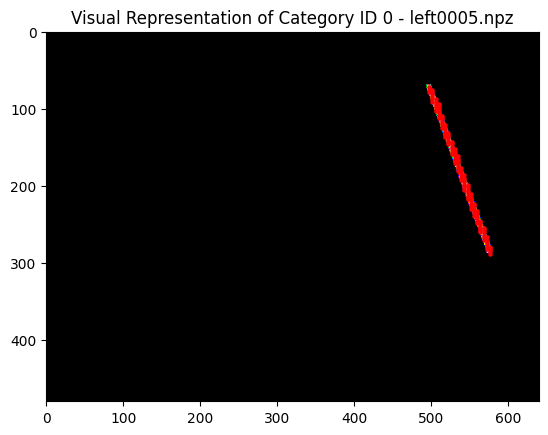

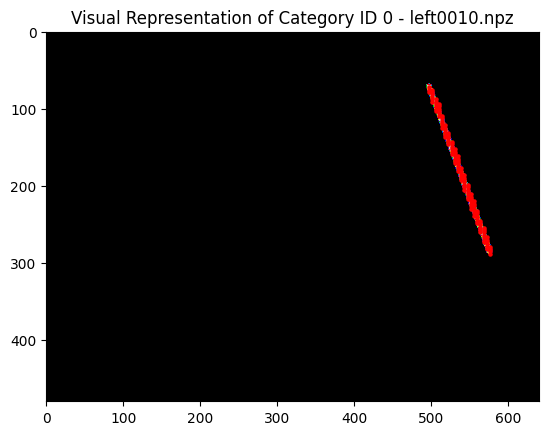

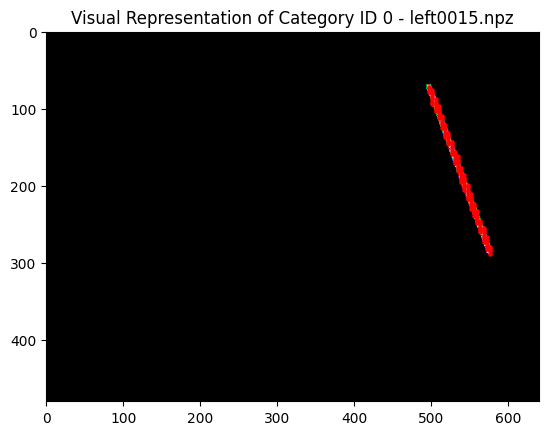

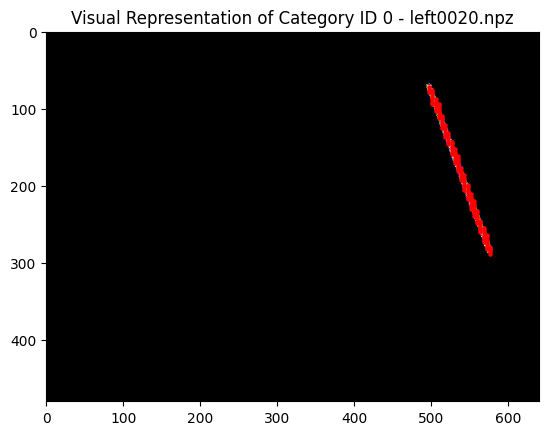

...

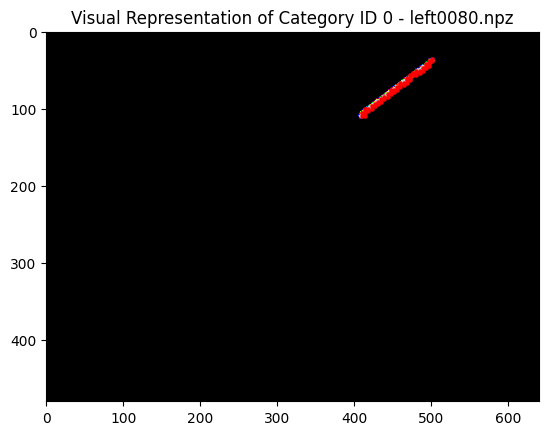

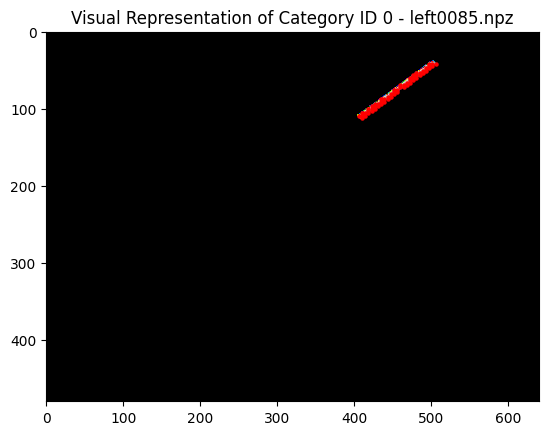

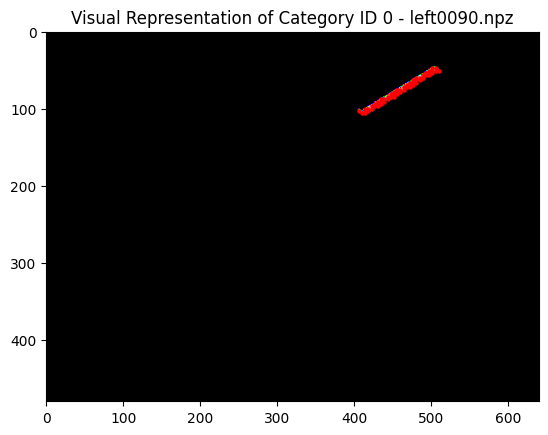

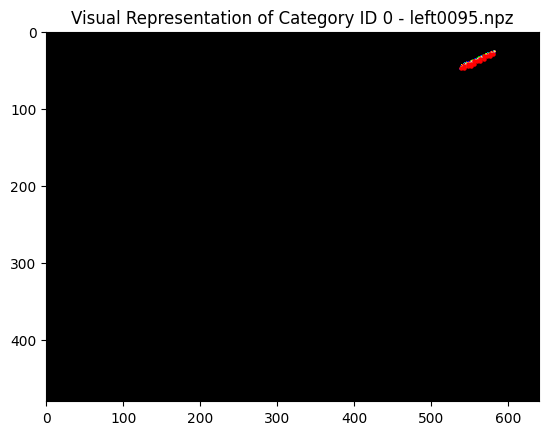

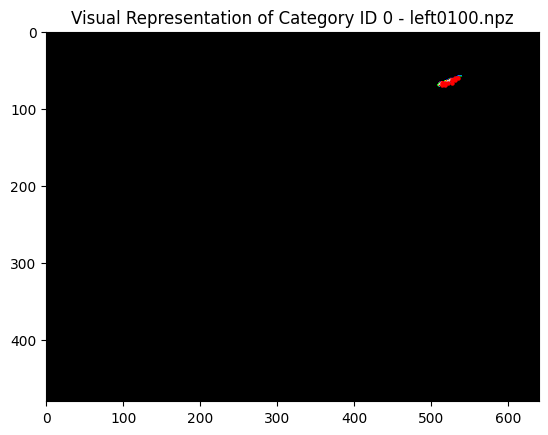

[[ 0.        0.        0.      ]
 [ 0.        8.888889  0.      ]
 [ 0.       17.777779  0.      ]
 [ 0.       26.666666  0.      ]
 [ 0.       35.555557  0.      ]
 [ 0.       44.444443  0.      ]
 [ 0.       53.333332  0.      ]
 [ 0.       62.22222   0.      ]
 [ 0.       71.111115  0.      ]
 [ 0.       80.        0.      ]]


In [ ]:
import json
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import torch
from scipy.ndimage import label


image_dir = "/home/student/Downloads/seq_1_segmented/seq_1_view_4_segmented/Annotations/"
json_path = "/home/student/Downloads/seq_1_segmented/seq_1_view_4_segmented/seq_1_view_4_segmented.json"


chosen_category_id =

with open(json_path, 'r') as f:
    json_data = json.load(f)


file_to_id_to_category_info = {}
for annotation in json_data['annotations']:
    file_name = annotation['file_name']
    file_num = int(file_name[4:8])
    if file_num % 5 == 0 and file_num >= 0:
        id_to_category_info = {}
        for segment_info in annotation['segments_info']:
            if segment_info['id'] != 0:
                id_to_category_info[segment_info['id']] = {
                    'category_id': segment_info['category_id'] + 1,
                    'other_info': segment_info
                }
        file_to_id_to_category_info[file_name] = id_to_category_info


def get_tracking_points(category_array):
    repeated_channel = category_array[None, None, None].repeat(3, axis=2)
    track_points, _ = model(torch.from_numpy(repeated_channel).cuda().float(), grid_size=150, segm_mask=torch.from_numpy(category_array)[None, None].cuda().float())
    return track_points

objp = np.zeros((10, 3), dtype=np.float32)

objp[:, 1] = np.linspace(0, 80, 10)
objpoints = []
imgpoints = []

for file_name in sorted(os.listdir(image_dir)):
    if file_name.endswith('.npz'):
        file_num = int(file_name[4:8])
        if file_num % 5 == 0 and file_num >= 0:
            file_path = os.path.join(image_dir, file_name)


            data = np.load(file_path)
            array = data['arr_0']


            if 'arr_0' in data:

                id_to_category_info = file_to_id_to_category_info.get(file_name.replace('.npz', '.jpg'), {})


                category_array = np.zeros_like(array)


                for id_value, info in id_to_category_info.items():
                    if info['category_id'] == chosen_category_id + 1:
                        category_array[array == id_value] = info['category_id']


                labeled_array, num_features = label(category_array)

                valid_ids = [1]
                for unique_id in np.unique(labeled_array):
                    if unique_id not in valid_ids:
                        labeled_array[labeled_array == unique_id]= 0


                track_points = get_tracking_points(labeled_array)
                track_points_sq = track_points.squeeze(1).squeeze(0).cpu().numpy()
                if track_points_sq.size != 0:
                    first_element = track_points_sq[0]
                    last_element = track_points_sq[-1]

                    indices = np.linspace(0, len(track_points_sq) - 1, 10, dtype=int)
                    selected_points = track_points_sq[indices]

                    imgpoints.append(selected_points)
                    objpoints.append(objp)


                plt.imshow(labeled_array, cmap='nipy_spectral')


                plt.scatter(track_points[0, 0, :, 0].cpu().numpy(), track_points[0, 0, :, 1].cpu().numpy(), color='red', s=5)

                plt.title(f'Visual Representation of Category ID {chosen_category_id} - {file_name}')
                plt.show()


                unique_category_ids = np.unique(category_array)

            else:
                print(f"Key 'arr_0' does not exist in the NPZ file: {file_name}")

            data.close()


print(objp)

In [ ]:
imgpoints

[array([[497.0401 ,  71.78243],
        [505.36548,  96.49332],
        [513.6909 , 121.2042 ],
        [522.0163 , 145.91508],
        [534.50446, 167.53711],
        [538.6671 , 192.24799],
        [551.1552 , 213.87001],
        [555.31793, 238.58089],
        [563.6433 , 260.20294],
        [576.1314 , 288.0027 ]], dtype=float32),
 array([[497.0401 ,  71.78243],
        [505.36548,  96.49332],
        [513.6909 , 121.2042 ],
        [522.0163 , 145.91508],
        [530.34174, 167.53711],
        [542.82983, 189.15913],
        [551.1552 , 213.87001],
        [559.48065, 235.49203],
        [563.6433 , 260.20294],
        [576.1314 , 288.0027 ]], dtype=float32),
 array([[497.0401 ,  71.78243],
        [505.36548,  96.49332],
        [517.85364, 121.2042 ],
        [526.179  , 145.91508],
        [534.50446, 167.53711],
        [542.82983, 192.24799],
        [546.99255, 216.95888],
        [555.31793, 238.58089],
        [567.806  , 260.20294],
        [576.1314 , 288.0027 ]], dtype

## the previous block tries to return the image coordinates of the 100 frames and pass it to the calibrateCamera function. The output of cv2.calibrateCamera includes the camera matrix, distortion coefficients, rotation and translation vectors for each view of the calibration pattern. This output is used to make the realisitic coordinates of the image, so that later we can make the 3d reconstruction of the object.

## after executing the cv2.calibrateCamera the code will fail due to numerical errors. This error occures due to numerical instability or insufficient input data for the calibration process. The cotracker was not able to retrieve enough features from the objects since the objects did not have any special texture and the fact that the size is quite small to extract enough points made this function to fail.

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints[0:19], imgpoints[0:19], [640, 480], None, None)

error: OpenCV(4.10.0) /io/opencv/modules/calib3d/src/calibration.cpp:1320: error: (-215:Assertion failed) fabs(sc) > DBL_EPSILON in function 'cvFindExtrinsicCameraParams2'


In [ ]:
import numpy as np

def find_min_max_indices(arr):
    # Find the index of the minimum value
    min_index = np.unravel_index(np.argmin(arr), arr.shape)

    # Find the index of the maximum value
    max_index = np.unravel_index(np.argmax(arr), arr.shape)

    return min_index, max_index

# Example usage:
arr = np.array([
    [1, 2, 3],
    [4, 0, 6],
    [7, 8, 9]
])

min_index, max_index = find_min_max_indices(arr)
print("Index of minimum value:", min_index)  # Output will be the index of the minimum value
print("Index of maximum value:", max_index)  # Output will be the index of the maximum value

Index of minimum value: (1, 1)
Index of maximum value: (2, 2)


In [ ]:
track_points

tensor([[[[530.0053,  61.1430],
          [511.2101,  65.7919],
          [517.4752,  65.7919],
          [523.7402,  65.7919],
          [511.2101,  70.4408],
          [504.9450,  84.3875],
          [448.5593,  89.0364],
          [454.8244,  89.0364],
          [504.9450,  89.0364],
          [436.0292,  93.6853],
          [442.2943,  93.6853],
          [448.5593,  93.6853],
          [504.9450,  93.6853],
          [423.4991,  98.3342],
          [429.7641,  98.3342],
          [436.0292,  98.3342],
          [504.9450,  98.3342],
          [417.2340, 102.9830],
          [423.4991, 102.9830],
          [504.9450, 102.9830],
          [511.2101, 102.9830],
          [511.2101, 107.6319],
          [511.2101, 112.2808],
          [511.2101, 116.9297],
          [517.4752, 121.5786],
          [517.4752, 126.2275],
          [517.4752, 130.8764],
          [517.4752, 135.5253],
          [523.7402, 135.5253],
          [141.5705, 140.1742],
          [523.7402, 140.1742],
        

In [ ]:
np.unique(category_array)

array([0, 1, 2, 3, 4, 5], dtype=uint32)

In [ ]:
import numpy as np
from scipy.ndimage import label

# Label the components
labeled_array, num_features = label(mask)

print("Labeled Array:")
print(labeled_array)
print("Number of Features (Table Legs):", num_features)


Labeled Array:
[[0 0 1 1 0]
 [0 2 0 0 0]
 [0 2 0 0 3]
 [0 2 0 0 3]
 [0 0 0 0 0]]
Number of Features (Table Legs): 3
